# Raster Processing to DataFrames


## Overview of Notebook
This notebook presents the framwork that is used to process the GeoTiff files that were downloaded from the national forestry inforamtion system. The raw data files came from the following two sources and url links to the databases.
### Data Sources
1) Goverment of Canada - Maps of Canada's forest attributes for 2001 and 2011
    
    URL: https://ftp.maps.canada.ca/pub/nrcan_rncan/Forests_Foret/canada-forests-attributes_attributs-forests-canada/ 

    Source: Beaudoin A, Bernier PY, Villemaire P, Guindon L, Guo XJ. 2017. Species composition, forest properties and land cover types across Canada’s forests at 250m resolution for 2001 and 2011. Natural Resources Canada, Canadian Forest
2) National Forestry Information System - National Terrestrial Ecosystem Monitoring System for Canada

    URL: https://opendata.nfis.org/mapserver/nfis-change_eng.html
    
    Source: Hermosilla, T., M.A. Wulder, J.C. White, N.C. Coops, G.W. Hobart, L.B. Campbell, 2016. Mass data processing of time series Landsat imagery: pixels to data products for forest monitoring. International Journal of Digital Earth 9(11), 1035-1054
    
### Raw Data Sets
File were downloaded as raw geotiff files (rasters). The following raw datasets were used for this project and a brief description for each is provided
1) Canada Forest Age in 2001 - Source (1) - This data presents the age of canadian forests in 2001 derived from Landsat imagery with granularity of 250mx250m.
2) Canada Forest Age in 2011 - Source (1) - This data presents the age of canadian forests in 2011 derived from Landsat imagery with granularity of 250mx250m.
3) Canada Forest Age in 2019 - Source (2) - This data presents the age of canadian forests in 2019 derived from Landsat imagery with granularity of 30mx30m.
4) Canada Year Forest was Harvested - Source (2) - This data presents the year of which a certain area was harvested, for years between the years of 1985 to 2001. The granulairy is 30mx30m. 
5) Canada Forest Volume in 2001 - Source (1) - This data presents the volume per hectar in 2001 derived from Landsat imagery with granularity of 250mx250m.
6) Canada Forest Volume in 2011 - Source (1) - This data presents the volume per hectar in 2011 derived from Landsat imagery with granularity of 250mx250m.
7) Canada Forest Volume in 2015 - Source (2) - This data presents the volume per hectar in 2015 derived from Landsat imagery with granularity of 30mx30m.

## 1) Understanding and Exploring the Data
To get a better understanding of the data, and since the files are so large (many of them a few gigabytes, even compressed) QGIS is used to understand the pixel values, coordinates and so forth. The files are simply added as a raster layer in QGIS with a colormap.

From this prelimary analysis, we can see that the data coming from source (1) has a coordinate granularity of 250m, while the data from source (2) has a 30m granularity. Considering the large size of memory that would be needed to process the data on a refined granularity, a granularity of 250m was selected for this project. However, the code below can be and was used to also generate data had a finner granularity of 30m. Below is a figure showing the 250m granularity for the data sets coming from (1) verus the data sets coming from (2).


### Canada Age in 2001
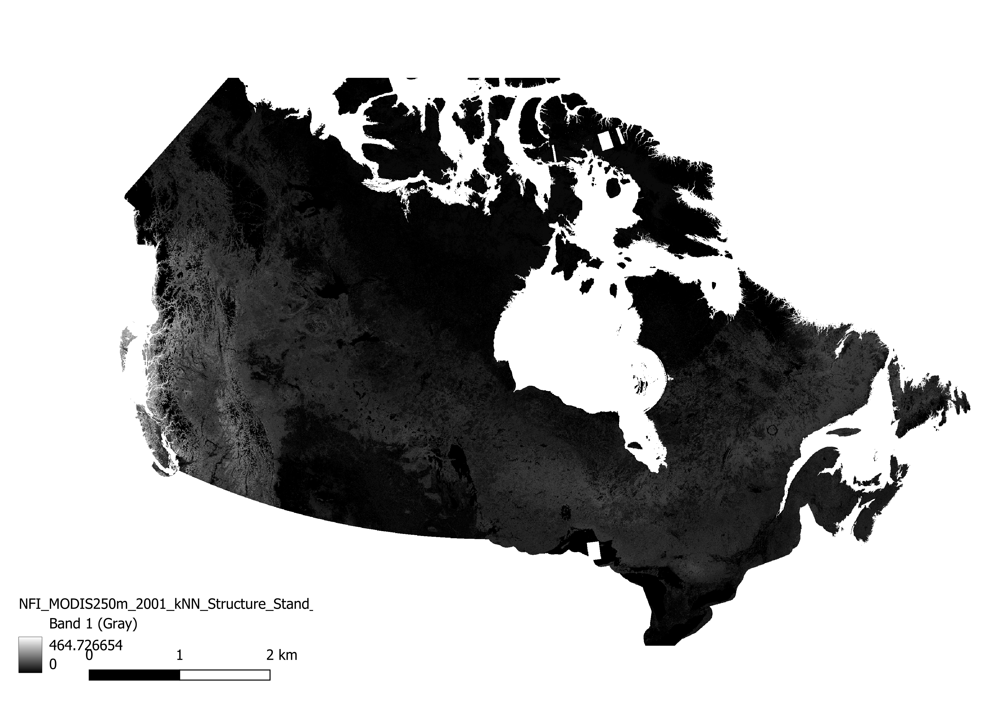

### Canada Age in 2019
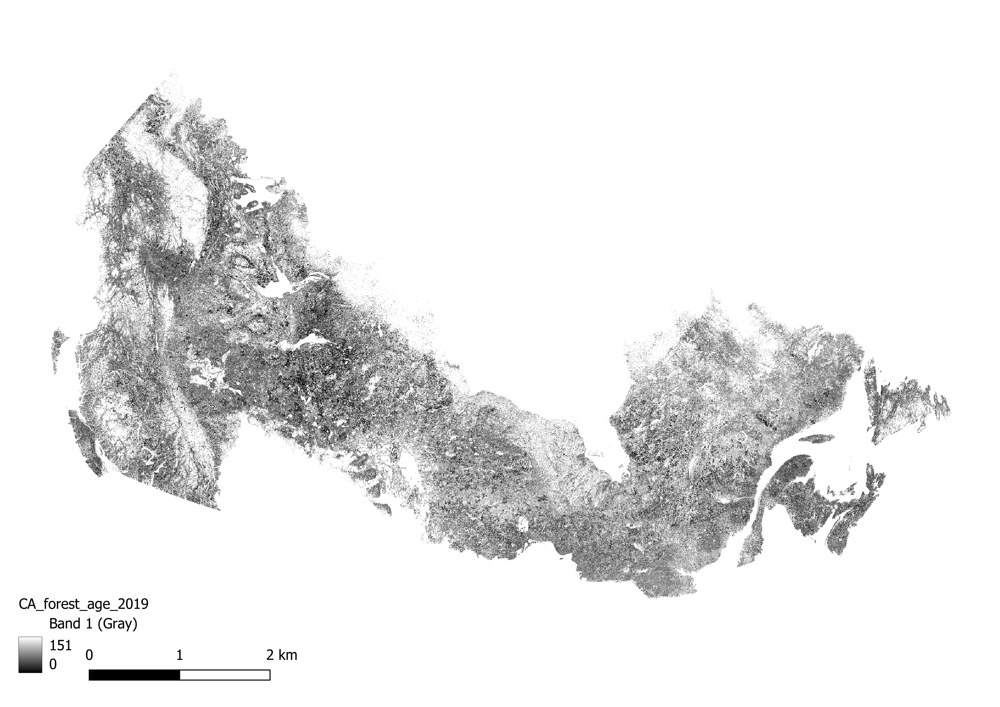

We can compare the granularity of both, by looking at a certain spot. For this, I selected Wistawasing Lake, or more commonly known as Wasi Lake, a lake just behind my childhood home in rural norther Ontario.

#### Wasi Lake Area Fores Age 2001
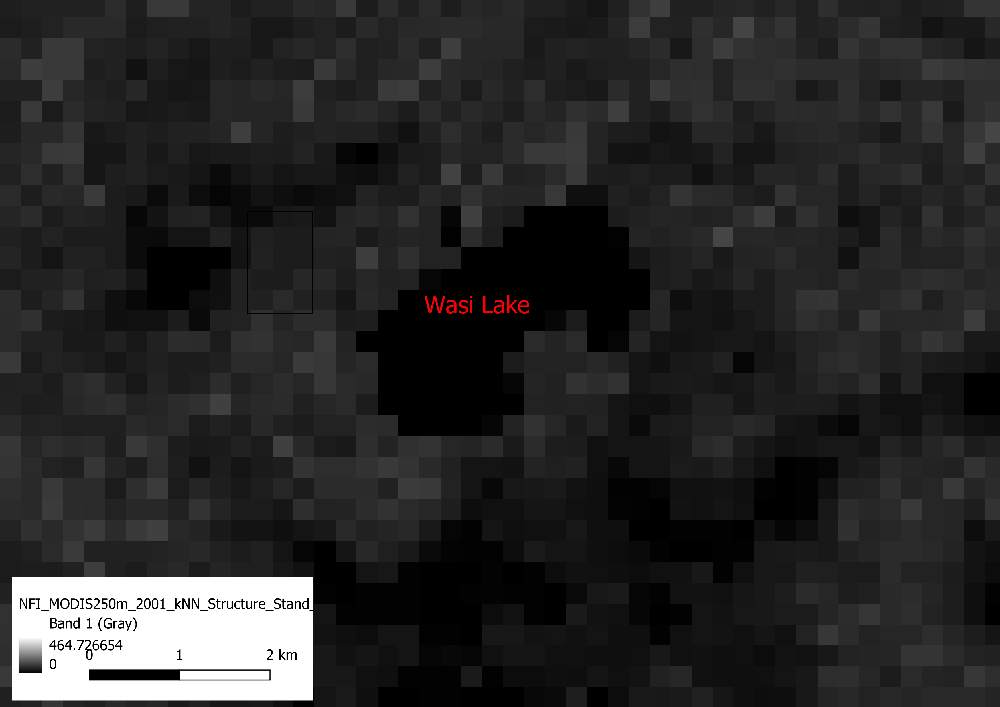

#### Wasi Lake Forest Age 2019
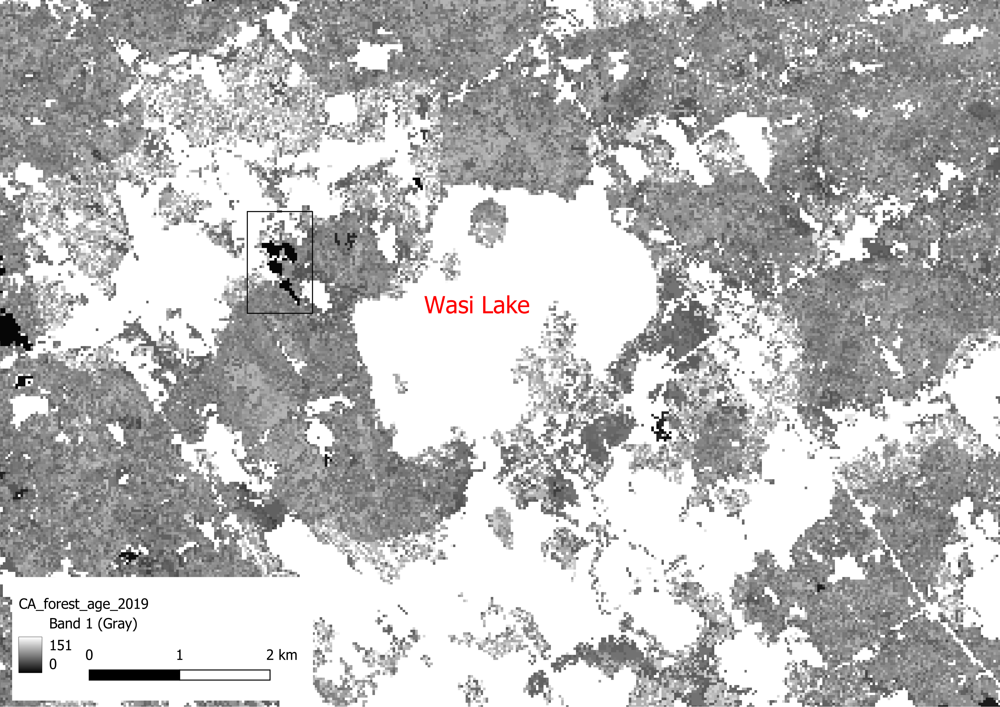

As we can see, the 30m granularity provides a very high level of detail. However, processing that data would be very computationally expensive. 

We can now start doing some preliminary data validation. We can look at a spot of congruent pixel, framed by the black box in the Canada 2019 Age Figure. Lets overlay the harvest year to the canadian age in 2019 below, which shows that this perticular spot was harvested in 2015.

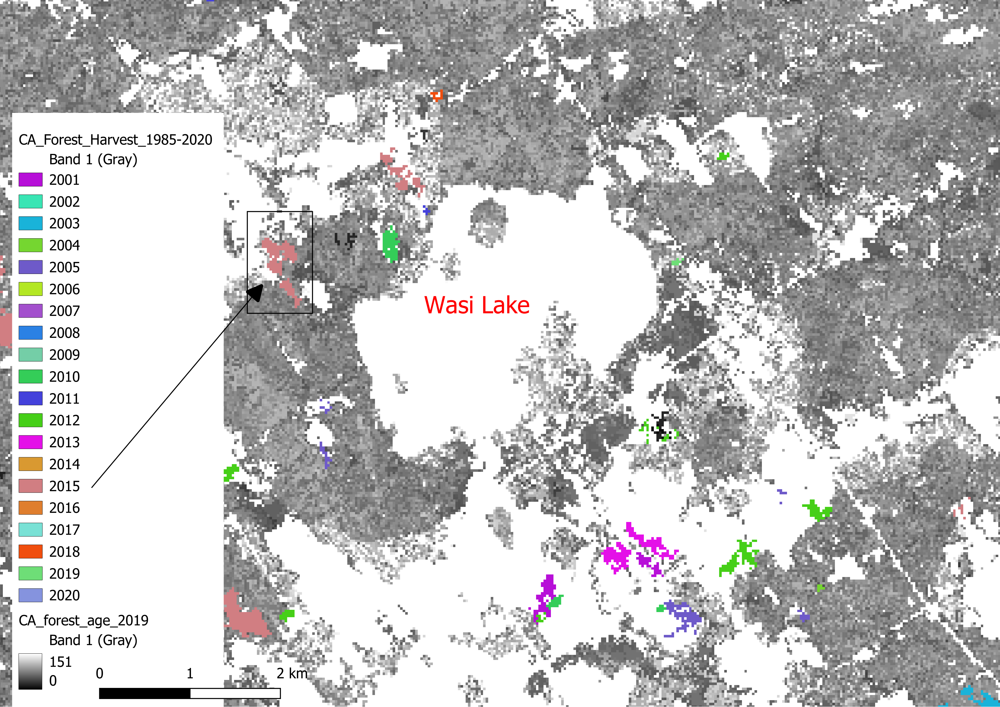

I can attest to the accuracy of this data. This perticular spot is just down the road from my house, and in the fall of 2015, we drove by and noticed that someone had logged an entire plot of land just by the road. That perticular plot of land is exactly where this spot is on these maps. Further, the age of this spot is also 4 years as of 2019, which provide further validation

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import georasters as gr
import rasterio
from rasterio.plot import show
from rasterio.windows import Window
import geopandas as gpd
from shapely.geometry import shape
from IPython.display import clear_output

In [2]:
#Try opening and showing image using georasters

In [3]:
path = r"I:\CME538 Project\CME538 Project"

In [4]:
os.listdir(path)

['ontario boundary',
 'processed data canada wide',
 'processed data ontario only',
 'raw data']

In [5]:
for folder in os.listdir(path):
    print("{}:\n{}\n\n".format(folder,os.listdir(path+"\\"+folder)))


ontario boundary:
['lpr_000b16a_e', 'Province']


processed data canada wide:
['age_blocks', 'CAharvest1985_2020_30m.tif', 'CAharvest1985_2020_30m.tif.aux.xml', 'harvest_blocks']


processed data ontario only:
['250m', '250mOntario_Forest_Data.csv.gz', '30m']


raw data:
['age2001', 'age2011', 'age2019', 'CA_forest_gross_stem_volume_2015_NN.tfw', 'CA_forest_gross_stem_volume_2015_NN.tif', 'CA_forest_gross_stem_volume_2015_NN.tif.aux.xml', 'CA_forest_gross_stem_volume_2015_NN.tif.ovr', 'CA_forest_gross_stem_volume_2015_NN.tif.xml', 'CA_forest_gross_stem_volume_2015_NN_LISEZMOI.txt', 'CA_forest_gross_stem_volume_2015_NN_README.txt', 'harvest2020', 'temp data', 'vol2001', 'vol2011']




In [6]:
#select folder we are interested in, processed data ontario only

In [19]:
filenames=[file for file in os.listdir(path+"\\processed data ontario only\\30m") if ("aux" not in file) and (".tif" in file)]
print(filenames)

['ONage2001_30m.tif', 'ONage2011_30m.tif', 'ONage2019_30m.tif', 'ONharvest1985_2020_30m.tif', 'ONvol2001_30m.tif', 'ONvol2011_30m.tif', 'ONvol2015_30m.tif']


In [8]:
#lets look at the bounds, and the file size quickly 

In [9]:
for file in filenames:
    with rasterio.open(path+"\\processed data ontario only\\30m\\"+file) as raster:
        print("The bounds of file {} is {}".format(file,raster.bounds))
        print("The total pixels of file {} is {}\n".format(file,raster.width*raster.height))


The bounds of file ONage2001_30m.tif is BoundingBox(left=-22890.524, bottom=-785051.8895, right=1649999.476, top=913218.1105)
The total pixels of file ONage2001_30m.tif is 3156687667

The bounds of file ONage2011_30m.tif is BoundingBox(left=-22890.524, bottom=-785051.8895, right=1649999.476, top=913218.1105)
The total pixels of file ONage2011_30m.tif is 3156687667

The bounds of file ONage2019_30m.tif is BoundingBox(left=-22890.524, bottom=-851351.8895, right=1651499.476, top=913218.1105)
The total pixels of file ONage2019_30m.tif is 3282864847

The bounds of file ONharvest1985_2020_30m.tif is BoundingBox(left=-27360.524, bottom=-851351.8895, right=1684229.476, top=894618.1105)
The total pixels of file ONharvest1985_2020_30m.tif is 3320427547

The bounds of file ONvol2001_30m.tif is BoundingBox(left=-22890.524, bottom=-785051.8895, right=1649999.476, top=913218.1105)
The total pixels of file ONvol2001_30m.tif is 3156687667

The bounds of file ONvol2011_30m.tif is BoundingBox(left=-2289

In [ ]:
#We will use rasterio package to import the geotif files and output as csv's. Since the file is so large, to reduce memory
#allocation, we will raster over blocks, or windows of the geotif and output a compressed csv. Further, only the important 
#data (non zero values) will stored.

In [10]:
#We need to define a function that will seperate the data set into an more manegeable block size. We will
#use the following two functions, one that generates the number of blocks required in both directions 
#based on a given required block size (number of pixels) and the second is a function that returns the dividers of a numner
#which is used internally in the num_blocks function
#fucntion that takes in a number and returns all the possible dividers.
def getDivs(N):
    """This function takes in a number and ouputs a list of sorted divisible number to that number
    Parameters:
        N = number
    Output:
        factors: sorted list of dividers
    """
    factors = {1}
    maxP  = int(N**0.5)
    p,inc = 2,1
    while p <= maxP:
        while N%p==0:
            factors.update([f*p for f in factors])
            N //= p
            maxP = int(N**0.5)
        p,inc = p+inc,2
    if N>1:
        factors.update([f*N for f in factors])
    return sorted(factors)   

def num_blocks(height,width,height_limit=10000,width_limit=10000):
    """This functions takes in a raster width and height (numer of x and y pixel) and a upper and lower limit
    for the block size, and returns a number of x blocks and y blocks for the specific raster
    Parameters:
        height: raster height 
        width: raster width
        width_limit: required approximate block width
        height_limit: required approximate block height
    Output:
        W,H: number of blocks in width and height directions
    """
    if ((height % 2) != 0):
        height = height -1
    if (width % 2) != 0:
        width = width -1
        
    height_div,width_div = getDivs(height),getDivs(width)
    W,H = width_div[min(range(len(width_div)), key = lambda i: abs(width_div[i]-width_limit))],height_div[min(range(len(height_div)), key = lambda i: abs(height_div[i]-height_limit))]
    
    return int(width/W),int(height/H)

In [11]:
def offset_coord(raster_xy,bin_num,A,B):
    """This function uses the shape x,y and bin value for a specific pixel and outputs the list of coordinates, and bin 
    values considering the block offset.
    
    Parameters:
        raster_xy = x_y value of rasterio object of the geotif file
        bin_num    =bin number values for this pixel
        A,B    = A is offset x_coordinates, B is offset y_coordinates
        
    Output:
        list of x_coordinate, y_coodrinate and bin number for that pixel.
    """
    x_coord = raster_xy[0]+A
    y_coord = raster_xy[1]-B
    return([x_coord,y_coord,bin_num])


def raster_scrape(filename,path,out_path,approx_height,approx_witdh,file_type,cond_nodata=True,cond_zero=True,start_y=0,start_x=0):
    """This functions serves as a raster "scraper", when raster files are two large to do in one shot.
    It will take in a raster, and read the bin inforamtion and coordinates over a set number of blocks while outputting
    a compressed csv file of each block containing the bin, and coordinate values for each pixel.
    **IMPORTANT** This function only works for rasters with one level of pixel value. A check is performed and nothing 
    happens if the number of band, or raster.count is not equal to 1.
    
    Parameters:
        filename: the filename of the raster from the directory
        path: path of raster
        out_path: directory path for output
        approx_width, approx_height: required approximate height and width of each raster block
        file_type: string saying what file type the input file is (ex: .tif)
        cond_nodata: bool that tells funciton to either not append nodata (True) or to append nodata (False), 
                    default is True
        cond_zero: bool that tells funciton to either not append xero data (True) or to append zeor data (False),
                    default is True
    Output:
        A folder containing n by m compresses csv files that contain the pixel coordinates, and the pixel value,
        and a text file with the raster crs in wkt format (well knwon text).
    """

    with rasterio.open(path+"\\"+filename) as raster:
        if raster.count != 1:
            print("Raster has one band, we can scrape the information\n")
        else:
            print("Raster has one band, we can scrape the information\n")
            #gets the num of x and y blocks
            blocks_w,blocks_h = num_blocks(raster.height,raster.width,approx_height,approx_width)
            print(blocks_w,blocks_h)
            
            #sets variable for if raster has no data
            no_data=raster.nodata
            
            #print some raster information
            print(raster.bounds)
            print(raster.indexes)
            print(raster.height)
            print(raster.width)
            
            #create new folder directory for this raster if doesnt already exist
            if not os.path.exists(out_path+"\\"+filename.strip(file_type)):
                os.mkdir(out_path+"\\"+filename.strip(file_type))
                
            #store the raster crs and output the raster in .txt file in outpath folder
            CRS = str(raster.crs)
            with open(out_path+"\\"+filename.strip(file_type)+"\\"+filename.strip(file_type)+".txt", "w") as text_file:
                text_file.write(CRS)
                
            #get the pixel size, in x and y
            pixel_size_w = abs(raster.bounds.left-raster.bounds.right)/raster.width
            pixel_size_h = abs(raster.bounds.top-raster.bounds.bottom)/raster.height
            
            
            #loop through the raster, in blocks
            for i in range(start_x,blocks_w):
                for k in range(start_y,blocks_h):
                    #get the block offset based on the the first block upper left coordinates. 
                    offset_w =(i*raster.width/blocks_w)*pixel_size_w
                    offset_h =(k*raster.height/blocks_h)*pixel_size_h
                    
                    #get total number of pixels for this block
                    num_p = (raster.width/blocks_w)*(raster.height/blocks_h)
                    
                    #read the pixel or bin information 
                    pixels = raster.read(1,window=Window(i*raster.width/blocks_w,k*raster.height/blocks_h,raster.width/blocks_w,raster.height/blocks_h))
                    #show(pixels)
                    
                    #create some counters for printing and keeping track of where we are. 
                    #j is to tell us that we have reached an increment of 100000 pixels
                    #z is multiplied by j to get the cummulative pixels to date, which are later printed
                    j=0
                    z=1
                    
                    #initialize empty list to store pixel information
                    data = []
                    
                    #loop through then entire 2D array of pixels and get the coordinates and bin information. 
                    for x,y in np.ndindex(pixels.shape):
                        j = j+1;
                        if j == 100000:
                            clear_output(wait=True)
                            print("Raster file name: {}\n\nWe are on pixel {} out of {} of block {}{} out of block {}{}: \n{}%".format(filename,j*z,num_p,i+1,k+1,blocks_h,blocks_w,j*z*100/num_p))
                            z = z+1
                            j=0
                            
                        #only append based on condition paramters.                        
                        if (cond_nodata == True) & (cond_zero == True):
                            if (pixels[x,y] != no_data) & (pixels[x,y] != 0):
                                data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                                
                        elif (cond_nodata == True) & (cond_zero == False):
                            if pixels[x,y] != no_data:
                                data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                                
                        elif (cond_nodata == False) & (cond_zero == True):
                            if pixels[x,y] != 0:
                                data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                                
                        else:
                            data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                    #if the lenght of data is zero, then there is no data, so dont output file, other wise output file
                    if len(data) !=0:
                        temp_data = pd.DataFrame(data)
                        temp_data.to_csv(out_path+"\\"+filename.strip(file_type)+"\\"+"Block"+str(i+1)+"_"+str(k+1)+".csv.gz",compression='gzip',header=['x_coord','y_coord','pixel_value'])
                        del pixels, data, temp_data
                    else:
                        del pixels, data
                        
    return print("raster is rasted :)")

In [12]:
num_blocks(raster.height,raster.width)

(6, 6)

In [20]:
filenames = filenames[4:]

In [21]:
filenames

['ONvol2001_30m.tif', 'ONvol2011_30m.tif', 'ONvol2015_30m.tif']

In [23]:
#selecting block size
approx_width, approx_height = 10000,10000

In [ ]:
#for file in filenames:
raster_scrape(filenames[1],
              r"I:\CME538 Project\CME538 Project\processed data ontario only\30m",
              r"I:\CME538 Project\CME538 Project\processed data ontario only\30m",
             approx_width,
             approx_height,
              '.tif',start_y=3,start_x=3)

Raster file name: ONvol2011_30m.tif

We are on pixel 14800000 out of 56369422.625 of block 66 out of block 87: 
26.25536915369461%


In [17]:
filename=filenames[0]
path = r"I:\CME538 Project\CME538 Project\processed data ontario only\250m"
out_path = r"I:\CME538 Project\CME538 Project\processed data ontario only\250m"
file_type = ".tif"
cond_nodata = True
cond_zero = True

In [21]:
with rasterio.open(path+"\\"+filename) as raster:
        if raster.count != 1:
            print("Raster has one band, we can scrape the information\n")
        else:
            print("Raster has one band, we can scrape the information\n")
            #gets the num of x and y blocks
            blocks_w,blocks_h = num_blocks(raster.height,raster.width,approx_height,approx_width)
            print(blocks_w,blocks_h)
            
            #sets variable for if raster has no data
            no_data=raster.nodata
            
            #print some raster information
            print(raster.bounds)
            print(raster.indexes)
            print(raster.height)
            print(raster.width)
            
            #create new folder directory for this raster if doesnt already exist
            if not os.path.exists(out_path+"\\"+filename.strip(file_type)):
                os.mkdir(out_path+"\\"+filename.strip(file_type))
                
            #store the raster crs and output the raster in .txt file in outpath folder
            CRS = str(raster.crs)
            with open(out_path+"\\"+filename.strip(file_type)+"\\"+filename.strip(file_type)+".txt", "w") as text_file:
                text_file.write(CRS)
                
            #get the pixel size, in x and y
            pixel_size_w = abs(raster.bounds.left-raster.bounds.right)/raster.width
            pixel_size_h = abs(raster.bounds.top-raster.bounds.bottom)/raster.height
            
            
            #loop through the raster, in blocks
            for i in range(blocks_w):
                for k in range(blocks_h):
                    #get the block offset based on the the first block upper left coordinates. 
                    offset_w =(i*raster.width/blocks_w)*pixel_size_w
                    offset_h =(k*raster.height/blocks_h)*pixel_size_h
                    
                    #get total number of pixels for this block
                    num_p = (raster.width/blocks_w)*(raster.height/blocks_h)
                    
                    #read the pixel or bin information 
                    pixels = raster.read(1,window=Window(i*raster.width/blocks_w,k*raster.height/blocks_h,raster.width/blocks_w,raster.height/blocks_h))
                    #show(pixels)
                    
                    #create some counters for printing and keeping track of where we are. 
                    #j is to tell us that we have reached an increment of 100000 pixels
                    #z is multiplied by j to get the cummulative pixels to date, which are later printed
                    j=0
                    z=1
                    
                    #initialize empty list to store pixel information
                    data = []
                    
                    #loop through then entire 2D array of pixels and get the coordinates and bin information. 
                    for x,y in np.ndindex(pixels.shape):
                        j = j+1;
                        if j == 100000:
                            clear_output(wait=True)
                            print("Raster file name: {}\n\nWe are on pixel {} out of {} of block {}{} out of block {}{}: \n{}%".format(filename,j*z,num_p,i+1,k+1,blocks_h,blocks_w,j*z*100/num_p))
                            z = z+1
                            j=0
                        if (pixels[x,y] != 0):
                            data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))    
                        #only append based on condition paramters.                        
                        #if (cond_nodata == True) & (cond_zero == True):
                        #    if (pixels[x,y] != no_data) & (pixels[x,y] != 0):
                        #        data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                        #        
                        #elif (cond_nodata == True) & (cond_zero == False):
                        #    if pixels[x,y] != no_data:
                        #        data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                        #        
                        #elif (cond_nodata == False) & (cond_zero == True):
                        #    if pixels[x,y] != 0:
                        #        data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                        #        
                        #else:
                        #    data.append(offset_coord(raster.xy(x,y),pixels[x,y],offset_w,offset_h))
                    #if the lenght of data is zero, then there is no data, so dont output file, other wise output file
                    if len(data) !=0:
                        temp_data = pd.DataFrame(data)
                        temp_data.to_csv(out_path+"\\"+filename.strip(file_type)+"\\"+"Block"+str(i+1)+"_"+str(k+1)+".csv.gz",compression='gzip',header=['x_coord','y_coord','pixel_value'])
                        del pixels, data, temp_data
                    else:
                        del pixels, data

Raster file name: ONage2001_250m.tif

We are on pixel 46200000 out of 46240000.0 of block 11 out of block 11: 
99.91349480968859%


In [181]:
temp = pd.read_csv(r"J:\CME538 Project\processed data ontario only\ONage2001_30m\Block0_0.csv.gz",compression='gzip',index_col=0)

In [182]:
temp

,x_coord,y_coord,pixel_value
0,-49985.000088,7.499985e+06,21.196667
1,-49955.000265,7.499985e+06,21.196667
2,-49925.000441,7.499985e+06,21.196667
3,-49895.000618,7.499985e+06,21.196667
4,-49865.000794,7.499985e+06,21.196667
...,...,...,...
19000876,80634.231563,7.369246e+06,37.376667
19000877,80664.231387,7.369246e+06,37.376667
19000878,80694.231210,7.369246e+06,37.376667
19000879,80724.231034,7.369246e+06,37.376667


In [ ]:
#Create color list from 1985 to 2020
from random import randint
colors = []

for i in range(len(x)):
    colors.append('#%06X' % randint(0, 0xFFFFFF))

print(colors)

In [ ]:
#create dataframe with colors and years, and merge to pre-existinig file
year_color = pd.DataFrame({'year':x,'color':colors})
year_color.head()

#merge with res dataframe, and re-initialize geopandas
#res = res.rename(columns={'data':'year'})
res = res.merge(year_color,how='left',on='year')

In [ ]:
gdf['color'] = res.color

In [ ]:
gdf.replace(0, np.nan, inplace=True)

In [ ]:

gdf.plot(aspect =1,column='data',legend=True,markersize=0.001)

In [ ]:
sys.getsizeof(gdf)

In [ ]:
gdf.to_crs(crs=4326)

In [ ]:
raster2 = rasterio.open("CA_Forest_Harvest_1985-2020.tif")
raster2.profile

In [ ]:
rsgislib.tools.projection.get_epsg_code_from_wkt(0)